In [0]:
# catboost package installation
!pip install catboost

In [0]:
# importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
from datetime import datetime
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb
from catboost import CatBoostClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from scipy import stats
import xgboost as xgb

# command for producing visualizations with higher resolution in notebook
plt.rcParams['figure.figsize'] = (13,8)
%config InlineBackend.figure_format = 'retina'


In [0]:
# Connecting colab to drive to import data files.
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Part 1: Customer Segmentation Report

In [0]:
azdias = pd.read_csv('/content/gdrive/My Drive/Bertelsmann Data Science Project/Azdias.csv',dtype={18:'str',19:'str'})
customers = pd.read_csv('/content/gdrive/My Drive/Bertelsmann Data Science Project/Customers.csv',dtype={18:'str',19:'str'})
att_vals = pd.read_excel('/content/gdrive/My Drive/Bertelsmann Data Science Project/DIAS Attributes - Values 2017.xlsx')

In [0]:
del att_vals['Unnamed: 0']

## Data pre-processing

In [0]:
# filling missing values of Unnamed: 1 with ffill.
att_vals['Unnamed: 1'].ffill(axis=0,inplace=True)

In [0]:
att_vals.columns = att_vals.iloc[0].values
att_vals.drop(index = 0,inplace=True)

In [0]:
features = att_vals['Attribute'].unique()

In [0]:
# since we only have feature info of limited columns therefore we will be dropping columns whose description is not mentioned.
coll = [col for col in azdias.columns if col not in features]
azdias.drop(columns=coll,inplace=True)
customers.drop(columns=coll,inplace=True)

In [0]:
# finding values using meaning column that represent missing values.
att_vals_na = att_vals[(att_vals['Meaning'].str.contains("unknown") | att_vals['Meaning'].str.contains("no "))]
pd.set_option('display.max_rows', 500)
att_vals_na

,Attribute,Description,Value,Meaning
1,AGER_TYP,best-ager typology,-1,unknown
2,AGER_TYP,NaN,0,no classification possible
6,ALTERSKATEGORIE_GROB,age classification through prename analysis,"-1, 0",unknown
12,ALTER_HH,main age within the household,0,unknown / no main age detectable
34,ANREDE_KZ,gender,"-1, 0",unknown
41,BALLRAUM,distance to next urban centre,-1,unknown
49,BIP_FLAG,business-flag indicating companies in the buil...,-1,unknown
50,BIP_FLAG,NaN,0,no company in the building
52,CAMEO_DEUG_2015,CAMEO classification 2015 - Uppergroup,-1,unknown
106,CAMEO_DEUINTL_2015,CAMEO classification 2015 - international typo...,-1,unknown


In [0]:
nans = []
for attributes in att_vals_na['Attribute'].unique():
    _ = att_vals_na.loc[att_vals_na['Attribute'] == attributes, 'Value'].astype(str).str.cat(sep=',')
    _ = _.split(',')
    nans.append(_)

In [0]:
nans = pd.concat([pd.Series(att_vals_na['Attribute'].unique()), pd.Series(nans)], axis=1)
nans.columns = ['Attributes', 'missing_or_unknown']
nans

,Attributes,missing_or_unknown
0,AGER_TYP,"[-1, 0]"
1,ALTERSKATEGORIE_GROB,"[-1, 0]"
2,ALTER_HH,[0]
3,ANREDE_KZ,"[-1, 0]"
4,BALLRAUM,[-1]
5,BIP_FLAG,"[-1, 0]"
6,CAMEO_DEUG_2015,[-1]
7,CAMEO_DEUINTL_2015,[-1]
8,CJT_GESAMTTYP,[0]
9,D19_BANKEN_ANZ_12,[0]


In [0]:
# re-encoding values that represent missing as np.NAN
for row in nans['Attributes']:
    print(row)
    if row in azdias.columns:
        _m = nans.loc[nans['Attributes'] == row, 'missing_or_unknown'].iloc[0]
        _i = azdias.loc[:, row].isin(_m)
        azdias.loc[_i, row] = np.NaN
    else:
        continue

for row in nans['Attributes']:
    if row in customers.columns:
        _m = nans.loc[nans['Attributes'] == row, 'missing_or_unknown'].iloc[0]
        _i = customers.loc[:, row].isin(_m)
        customers.loc[_i, row] = np.NaN
    else:
        continue


AGER_TYP
ALTERSKATEGORIE_GROB
ALTER_HH
ANREDE_KZ
BALLRAUM
BIP_FLAG
CAMEO_DEUG_2015
CAMEO_DEUINTL_2015
CJT_GESAMTTYP
D19_BANKEN_ANZ_12
D19_BANKEN_ANZ_24
D19_BANKEN_DATUM
D19_BANKEN_DIREKT_RZ
D19_BANKEN_GROSS_RZ
D19_BANKEN_LOKAL_RZ
D19_BANKEN_OFFLINE_DATUM
D19_BANKEN_ONLINE_DATUM
D19_BANKEN_ONLINE_QUOTE_12
D19_BANKEN_REST_RZ
D19_BEKLEIDUNG_GEH_RZ
D19_BEKLEIDUNG_REST_RZ
D19_BILDUNG_RZ
D19_BIO_OEKO_RZ
D19_BUCH_RZ
D19_DIGIT_SERV_RZ
D19_DROGERIEARTIKEL_RZ
D19_ENERGIE_RZ
D19_FREIZEIT_RZ
D19_GARTEN_RZ
D19_GESAMT_ANZ_12
D19_GESAMT_ANZ_24
D19_GESAMT_DATUM
D19_GESAMT_OFFLINE_DATUM
D19_GESAMT_ONLINE_DATUM
D19_GESAMT_ONLINE_QUOTE_12
D19_HANDWERK_RZ
D19_HAUS_DEKO_RZ
D19_KINDERARTIKEL_RZ
D19_KK_KUNDENTYP
D19_KOSMETIK_RZ
D19_LEBENSMITTEL_RZ
D19_LOTTO_RZ
D19_NAHRUNGSERGAENZUNG_RZ
D19_RATGEBER_RZ
D19_REISEN_RZ
D19_SAMMELARTIKEL_RZ
D19_SCHUHE_RZ
D19_SONSTIGE_RZ
D19_TECHNIK_RZ
D19_TELKO_ANZ_12
D19_TELKO_ANZ_24
D19_TELKO_DATUM
D19_TELKO_MOBILE_RZ
D19_TELKO_OFFLINE_DATUM
D19_TELKO_ONLINE_DATUM
D19_TELKO_RES

In [0]:
# Saving files to drive for further use
#%cd /content/gdrive/My Drive/Bertelsmann Data Science Project
#azdias = azdias.to_csv('azdias_with_missing')
#customers = customers.to_csv('customers_with_missing_values')
#nans = nans.to_csv('nans')

In [0]:
azdias.head()

,AGER_TYP,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_PERSONEN,ANZ_TITEL,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CJT_GESAMTTYP,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_KONSUMTYP,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,EWDICHTE,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,...,MIN_GEBAEUDEJAHR,MOBI_REGIO,NATIONALITAET_KZ,ONLINE_AFFINITAET,ORTSGR_KLS9,OST_WEST_KZ,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_GBZ,PLZ8_HHZ,PRAEGENDE_JUGENDJAHRE,REGIOTYP,RELAT_AB,RETOURTYP_BK_S,SEMIO_DOM,SEMIO_ERL,SEMIO_FAM,SEMIO_KAEM,SEMIO_KRIT,SEMIO_KULT,SEMIO_LUST,SEMIO_MAT,SEMIO_PFLICHT,SEMIO_RAT,SEMIO_REL,SEMIO_SOZ,SEMIO_TRADV,SEMIO_VERT,SHOPPER_TYP,TITEL_KZ,VERS_TYP,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,3.0,3.0,...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,6.0,3.0,6.0,6.0,7.0,3.0,5.0,5.0,5.0,4.0,7.0,2.0,3.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,3.0,1.0,2.0
1,NaN,NaN,11.0,0.0,2.0,0.0,6.0,8A,8.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,5.0,5.0,1.0,...,1992.0,1.0,1.0,3.0,5.0,W,2.0,3.0,2.0,1.0,1.0,4.0,5.0,14.0,3.0,4.0,1.0,7.0,2.0,4.0,4.0,4.0,3.0,2.0,3.0,7.0,6.0,4.0,5.0,6.0,1.0,3.0,NaN,2.0,3.0,9.0,4.0,5.0,2.0,1.0
2,NaN,17.0,10.0,0.0,1.0,0.0,2.0,4C,4.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,2.0,5.0,1.0,...,1992.0,3.0,1.0,2.0,5.0,W,3.0,3.0,1.0,0.0,1.0,4.0,4.0,15.0,2.0,2.0,3.0,7.0,6.0,1.0,7.0,7.0,3.0,4.0,3.0,3.0,4.0,3.0,4.0,3.0,4.0,2.0,NaN,1.0,3.0,9.0,2.0,5.0,2.0,3.0
3,2.0,13.0,1.0,0.0,0.0,0.0,4.0,2A,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,2.0,4.0,...,1997.0,4.0,1.0,1.0,3.0,W,2.0,2.0,2.0,0.0,1.0,4.0,3.0,8.0,NaN,3.0,2.0,4.0,7.0,1.0,5.0,4.0,4.0,4.0,1.0,4.0,3.0,2.0,5.0,4.0,4.0,1.0,NaN,1.0,NaN,9.0,7.0,3.0,2.0,4.0
4,NaN,20.0,3.0,0.0,4.0,0.0,2.0,6B,6.0,5.0,3.0,5.0,5.0,NaN,5.0,10.0,6.0,6.0,1.0,6.0,1.0,10.0,1.0,NaN,1.0,6.0,8.0,NaN,6.0,6.0,1.0,9.0,1.0,10.0,1.0,3.0,5.0,1.0,2.0,4.0,...,1992.0,3.0,1.0,5.0,6.0,W,2.0,4.0,2.0,1.0,2.0,3.0,3.0,8.0,5.0,5.0,5.0,2.0,4.0,4.0,2.0,3.0,6.0,4.0,2.0,4.0,2.0,4.0,6.0,2.0,7.0,2.0,NaN,2.0,2.0,9.0,3.0,4.0,1.0,3.0


In [0]:
azdias.describe()

,AGER_TYP,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_PERSONEN,ANZ_TITEL,BALLRAUM,CJT_GESAMTTYP,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_KONSUMTYP,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,EWDICHTE,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,...,LP_STATUS_GROB,MIN_GEBAEUDEJAHR,MOBI_REGIO,NATIONALITAET_KZ,ONLINE_AFFINITAET,ORTSGR_KLS9,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_GBZ,PLZ8_HHZ,PRAEGENDE_JUGENDJAHRE,REGIOTYP,RELAT_AB,RETOURTYP_BK_S,SEMIO_DOM,SEMIO_ERL,SEMIO_FAM,SEMIO_KAEM,SEMIO_KRIT,SEMIO_KULT,SEMIO_LUST,SEMIO_MAT,SEMIO_PFLICHT,SEMIO_RAT,SEMIO_REL,SEMIO_SOZ,SEMIO_TRADV,SEMIO_VERT,SHOPPER_TYP,TITEL_KZ,VERS_TYP,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
count,205378.000000,580954.000000,798073.000000,794213.000000,817722.000000,817722.000000,797481.000000,886367.000000,59487.000000,97121.000000,212890.000000,19686.000000,164239.000000,45234.000000,306424.000000,385918.000000,537051.000000,332663.000000,440226.000000,241033.000000,634108.000000,33231.000000,65013.000000,225423.000000,72107.000000,8203.000000,253249.000000,327403.000000,453335.000000,256988.000000,396757.000000,216741.000000,69932.000000,114184.000000,797481.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,...,886367.000000,798073.000000,757897.000000,782906.000000,886367.000000,794005.000000,774706.000000,774706.000000,774706.000000,774706.000000,774706.000000,774706.000000,774706.000000,783057.000000,733157.000000,793846.000000,886367.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,891221.000000,780025.000000,2160.000000,780025.000000,743233.000000,817722.000000,791123.000000,891221.000000,891221.000000,891221.000000
mean,1.743410,15.291805,8.287263,0.040647,1.727637,0.004162,4.153043,3.632838,1.832804,2.017957,6.933200,6.685817,6.956204,9.886059,2.320027,2.864013,5.140640,7.413848,5.304019,9.368128,5.424540,1.315639,1.354437,7.741446,7.874617,8.020480,2.127839,2.610126,5.512548,7.665440,5.378252,9.492067,1.447692,1.615647,3.939172,3.033328,3.075121,3.074528,2.821039,2.874167,...,2.432575,1993.277011,2.963540,1.168889,2.698691,5.293002,2.253330,2.801858,1.595426,0.699166,1.943913,3.381087,3.612821,9.280709,4.472086,3.071033,3.419630,4.667550,4.481405,4.272729,4.445007,4.763223,4.025014,4.359086,4.001597,4.256076,3.910139,4.240609,3.945860,3.661784,4.023709,1.590134,1.318519,1.511166,4.147141,7.908791,4.088440,3.362438,1.522098,2.777398
std,0.674312,3.800536,15.628087,0.324028,1.155849,0.068855,2.183710,1.595021,1.080954,1.226588,2.335306,2.421747,2.332829,0.765394,1.272181,1.497983,2.782871,2.047270,2.747413,1.640414,3.234275,0.632176,0.650309,1.825844,1.650424,1.558834,1.190232,1.434433,2.770594,1.863684,2.756699,1.497877,0.691940,0.834033,1.718996,1.529603,1.353248,1.321055,1.464749,1.486731,...,1.474315,3.332739,1.428882,0.475075,1.521524,2.303739,0.972008,0.920309,0.986736,0.727137,1.459654,1.111598,0.973967,4.032107,1.836357,1.360532,1.417741,1.795712,1.807552,1.915885,1.852412,1.830789,1.903816,2.022829,1.857540,1.770137,1.580306,2.007373,1.946564,1.707637,2.077746,1.027972,0.999504,0.499876,1.784211,1.923137,1.920553,1.352704,0.499512,1.068775
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00

In [0]:
customers.head()

,AGER_TYP,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_PERSONEN,ANZ_TITEL,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CJT_GESAMTTYP,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_KONSUMTYP,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,EWDICHTE,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,...,ONLINE_AFFINITAET,ORTSGR_KLS9,OST_WEST_KZ,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_GBZ,PLZ8_HHZ,PRAEGENDE_JUGENDJAHRE,REGIOTYP,RELAT_AB,RETOURTYP_BK_S,SEMIO_DOM,SEMIO_ERL,SEMIO_FAM,SEMIO_KAEM,SEMIO_KRIT,SEMIO_KULT,SEMIO_LUST,SEMIO_MAT,SEMIO_PFLICHT,SEMIO_RAT,SEMIO_REL,SEMIO_SOZ,SEMIO_TRADV,SEMIO_VERT,SHOPPER_TYP,TITEL_KZ,VERS_TYP,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,PRODUCT_GROUP,CUSTOMER_GROUP,ONLINE_PURCHASE,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,2.0,10.0,1.0,0.0,2.0,0.0,3.0,1A,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,9.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,9.0,NaN,NaN,NaN,NaN,2.0,1.0,2.0,5.0,...,3.0,2.0,W,3.0,3.0,1.0,0.0,1.0,5.0,5.0,4.0,1.0,1.0,5.0,1.0,3.0,5.0,1.0,3.0,4.0,7.0,6.0,2.0,1.0,2.0,6.0,1.0,6.0,3.0,NaN,1.0,6.0,9.0,7.0,3.0,COSMETIC_AND_FOOD,MULTI_BUYER,0,1.0,4.0
1,NaN,11.0,NaN,NaN,3.0,0.0,NaN,NaN,NaN,NaN,NaN,1.0,6.0,NaN,NaN,NaN,NaN,1.0,6.0,NaN,9.0,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,NaN,9.0,NaN,NaN,NaN,NaN,1.0,2.0,5.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0,6.0,2.0,3.0,4.0,5.0,6.0,4.0,1.0,2.0,3.0,1.0,7.0,3.0,NaN,1.0,NaN,9.0,NaN,3.0,FOOD,SINGLE_BUYER,0,1.0,4.0
2,NaN,6.0,1.0,0.0,1.0,0.0,7.0,5D,5.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,1.0,4.0,5.0,...,1.0,5.0,W,2.0,3.0,3.0,1.0,3.0,2.0,3.0,4.0,7.0,3.0,5.0,5.0,7.0,2.0,6.0,7.0,1.0,7.0,3.0,4.0,2.0,1.0,2.0,1.0,3.0,1.0,NaN,2.0,6.0,9.0,2.0,3.0,COSMETIC_AND_FOOD,MULTI_BUYER,0,2.0,4.0
3,1.0,8.0,0.0,NaN,0.0,0.0,7.0,4C,4.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,6.0,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,6.0,6.0,NaN,NaN,NaN,NaN,1.0,2.0,2.0,5.0,...,2.0,3.0,W,3.0,2.0,1.0,0.0,1.0,4.0,3.0,1.0,6.0,1.0,3.0,3.0,3.0,5.0,3.0,3.0,4.0,5.0,4.0,3.0,3.0,3.0,6.0,4.0,7.0,0.0,NaN,1.0,NaN,9.0,7.0,1.0,COSMETIC,MULTI_BUYER,0,1.0,4.0
4,NaN,20.0,7.0,0.0,4.0,0.0,3.0,7B,7.0,6.0,1.0,2.0,3.0,NaN,7.0,NaN,3.0,5.0,1.0,8.0,1.0,10.0,1.0,NaN,1.0,7.0,NaN,9.0,3.0,5.0,1.0,8.0,1.0,10.0,NaN,NaN,4.0,4.0,2.0,3.0,...,5.0,5.0,W,2.0,4.0,2.0,1.0,2.0,3.0,3.0,8.0,7.0,1.0,5.0,5.0,4.0,5.0,2.0,3.0,5.0,6.0,6.0,5.0,5.0,4.0,4.0,4.0,5.0,1.0,NaN,2.0,2.0,9.0,3.0,1.0,FOOD,MULTI_BUYER,0,1.0,3.0


In [0]:
azdias.shape,customers.shape

((891221, 272), (191652, 275))

In [0]:
# dropping the 3 extra columns in customers
coll = [col for col in customers.columns if col not in azdias.columns]
customers.drop(columns=coll,inplace=True)

In [0]:
azdias.shape,customers.shape

((891221, 272), (191652, 272))

In [0]:
# converting all integer values to float values for consistency.
def fltconv(df):
  for col in df.columns:
      if df[col].dtype == np.int64:
          df[col] = df[col].astype(np.float64)

In [0]:
fltconv(azdias)
fltconv(customers)

In [0]:
nan_in_cols = azdias.shape[0] - azdias.count()

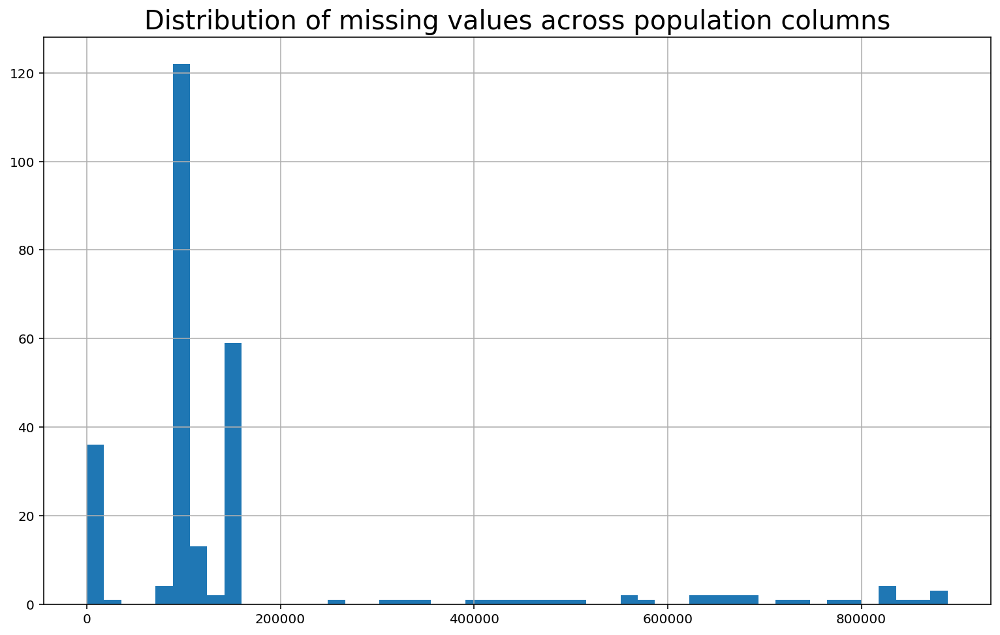

In [0]:
plt.title('Distribution of missing values across population columns',fontdict = {'fontsize' : 20})
nan_in_cols.hist(bins=50);

In [0]:
# dropping columns with more than 200000 missing values in azdias.
drop_cols = azdias.columns[nan_in_cols > 200000]
print(drop_cols)
azdias.drop(drop_cols, axis=1, inplace = True)
azdias.shape

Index(['AGER_TYP', 'ALTER_HH', 'D19_BANKEN_ANZ_12', 'D19_BANKEN_ANZ_24',
       'D19_BANKEN_DATUM', 'D19_BANKEN_OFFLINE_DATUM',
       'D19_BANKEN_ONLINE_DATUM', 'D19_BANKEN_ONLINE_QUOTE_12',
       'D19_GESAMT_ANZ_12', 'D19_GESAMT_ANZ_24', 'D19_GESAMT_DATUM',
       'D19_GESAMT_OFFLINE_DATUM', 'D19_GESAMT_ONLINE_DATUM',
       'D19_GESAMT_ONLINE_QUOTE_12', 'D19_KONSUMTYP', 'D19_TELKO_ANZ_12',
       'D19_TELKO_ANZ_24', 'D19_TELKO_DATUM', 'D19_TELKO_OFFLINE_DATUM',
       'D19_TELKO_ONLINE_DATUM', 'D19_VERSAND_ANZ_12', 'D19_VERSAND_ANZ_24',
       'D19_VERSAND_DATUM', 'D19_VERSAND_OFFLINE_DATUM',
       'D19_VERSAND_ONLINE_DATUM', 'D19_VERSAND_ONLINE_QUOTE_12',
       'D19_VERSI_ANZ_12', 'D19_VERSI_ANZ_24', 'KBA05_ANTG1', 'KBA05_ANTG2',
       'KBA05_ANTG3', 'KBA05_ANTG4', 'KBA05_BAUMAX', 'KBA05_MAXVORB',
       'TITEL_KZ'],
      dtype='object')


(891221, 237)

In [0]:
nan_in_cols2 = customers.shape[0] - customers.count()

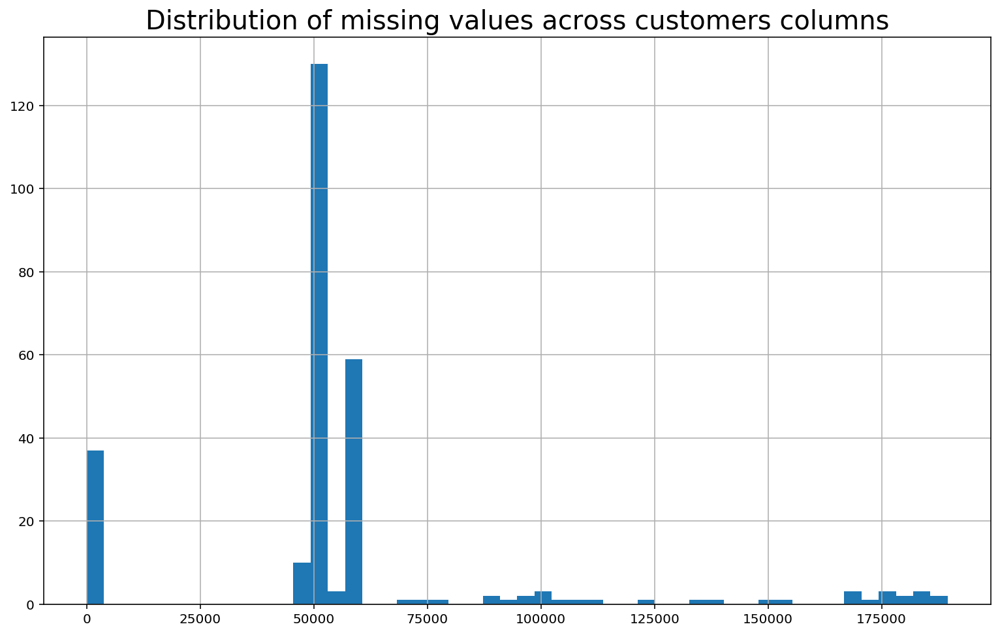

In [0]:
plt.title('Distribution of missing values across customers columns',fontdict = {'fontsize' : 20})
nan_in_cols2.hist(bins=50);

In [0]:
# dropping columns with more than 65000 missing values in customers.
drop_cols2 = customers.columns[nan_in_cols2 > 65000]
print(drop_cols2)
customers.drop(drop_cols, axis=1, inplace = True)
customers.shape

Index(['AGER_TYP', 'ALTER_HH', 'D19_BANKEN_ANZ_12', 'D19_BANKEN_ANZ_24',
       'D19_BANKEN_DATUM', 'D19_BANKEN_OFFLINE_DATUM',
       'D19_BANKEN_ONLINE_DATUM', 'D19_BANKEN_ONLINE_QUOTE_12',
       'D19_GESAMT_ANZ_12', 'D19_GESAMT_ANZ_24', 'D19_GESAMT_OFFLINE_DATUM',
       'D19_GESAMT_ONLINE_DATUM', 'D19_GESAMT_ONLINE_QUOTE_12',
       'D19_TELKO_ANZ_12', 'D19_TELKO_ANZ_24', 'D19_TELKO_DATUM',
       'D19_TELKO_OFFLINE_DATUM', 'D19_TELKO_ONLINE_DATUM',
       'D19_VERSAND_ANZ_12', 'D19_VERSAND_ANZ_24', 'D19_VERSAND_DATUM',
       'D19_VERSAND_OFFLINE_DATUM', 'D19_VERSAND_ONLINE_DATUM',
       'D19_VERSAND_ONLINE_QUOTE_12', 'D19_VERSI_ANZ_12', 'D19_VERSI_ANZ_24',
       'KBA05_ANTG1', 'KBA05_ANTG2', 'KBA05_ANTG3', 'KBA05_ANTG4',
       'KBA05_BAUMAX', 'KBA05_MAXVORB', 'TITEL_KZ'],
      dtype='object')


(191652, 237)

In [0]:
nan_in_rows = azdias.shape[1] - azdias.count(axis = 1)

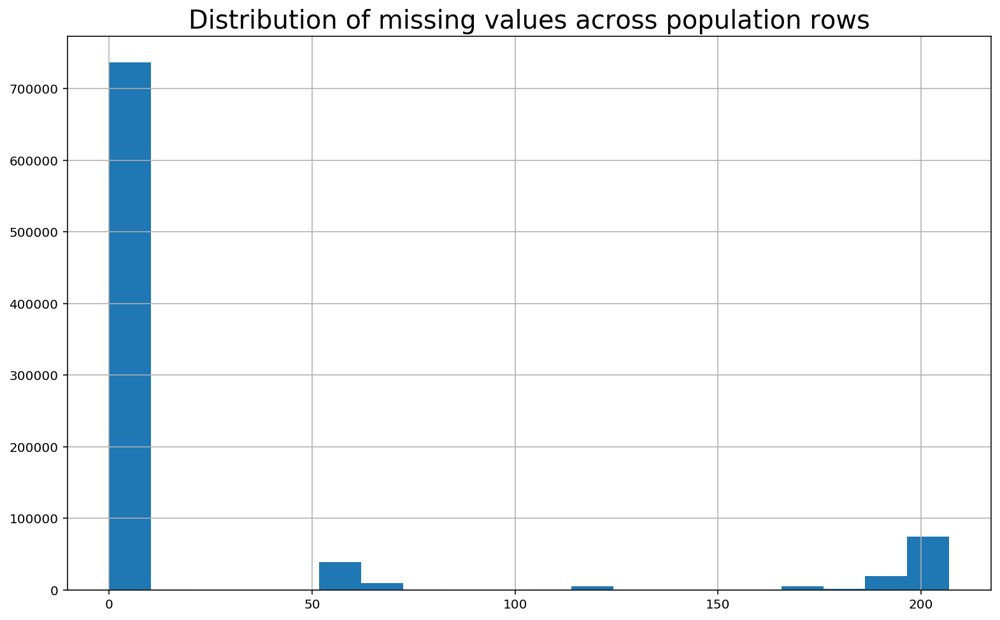

In [0]:
plt.title('Distribution of missing values across population rows',fontdict = {'fontsize' : 20})
nan_in_rows.hist(bins=20);

In [0]:
# dropping rows with more than 50 missing values in azdias.
drop_rows = azdias.index[nan_in_rows > 50]
print(drop_rows)
azdias.drop(drop_rows, axis=0, inplace = True)
azdias.shape

Int64Index([     0,     11,     12,     13,     14,     15,     17,     20,
                23,     24,
            ...
            891164, 891169, 891170, 891171, 891172, 891173, 891175, 891185,
            891187, 891203],
           dtype='int64', length=153933)


(737288, 237)

In [0]:
nan_in_rows2 = customers.shape[1] - customers.count(axis = 1)

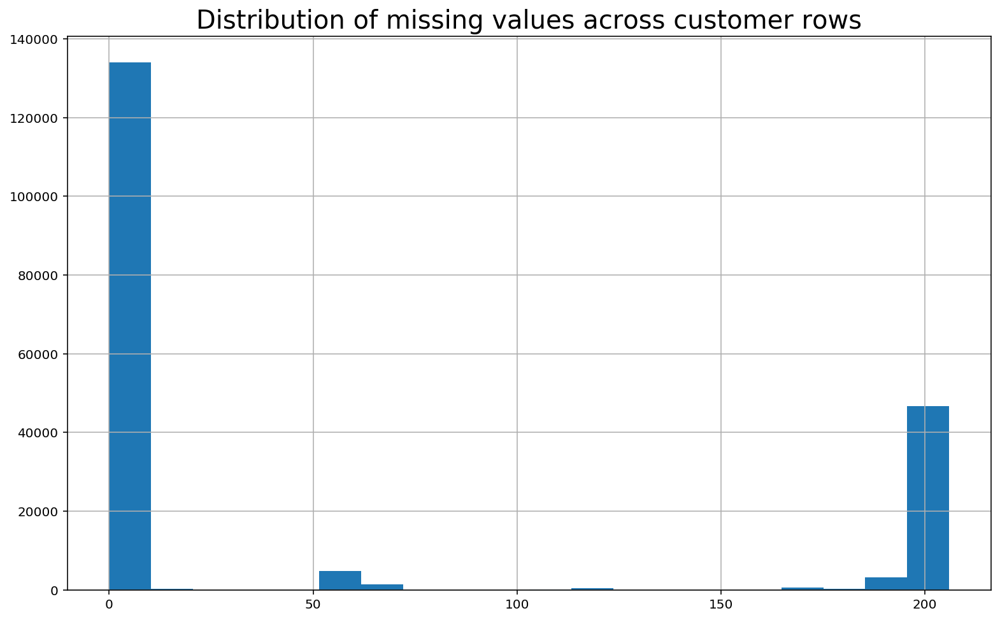

In [0]:
plt.title('Distribution of missing values across customer rows',fontdict = {'fontsize' : 20})
nan_in_rows2.hist(bins=20);

In [0]:
# dropping rows with more than 50 missing values in customers.
drop_rows2 = customers.index[nan_in_rows2 > 50]
print(drop_rows2)
customers.drop(drop_rows2, axis=0, inplace = True)
customers.shape

Int64Index([     1,     10,     13,     20,     36,     37,     38,     39,
                40,     43,
            ...
            191494, 191527, 191541, 191553, 191565, 191570, 191575, 191597,
            191605, 191639],
           dtype='int64', length=57406)


(134246, 237)

In [0]:
# Re-encoding the only binary variable found.
azdias['OST_WEST_KZ'].replace(['W', 'O'], [1, 0], inplace=True)
customers['OST_WEST_KZ'].replace(['W', 'O'], [1, 0], inplace=True)

In [0]:
#dropping columns with greater than 10 different values for simplicity.
cat_cols_to_drop = ['CAMEO_DEU_2015', 'GFK_URLAUBERTYP', 'LP_FAMILIE_FEIN', 'LP_LEBENSPHASE_FEIN', 
                   'LP_LEBENSPHASE_GROB', 'LP_STATUS_FEIN', 'PRAEGENDE_JUGENDJAHRE','CAMEO_DEUG_2015']
# Doing one-hot encoding on columns with less than 10 different values.
dummy_cols = ['CJT_GESAMTTYP', 'FINANZTYP', 'GEBAEUDETYP', 'GEBAEUDETYP_RASTER', 'HEALTH_TYP', 
                    'KBA05_HERSTTEMP', 'KBA05_MAXHERST', 'KBA05_MODTEMP', 'LP_FAMILIE_GROB', 'LP_STATUS_GROB',
                    'NATIONALITAET_KZ', 'SHOPPER_TYP', 'VERS_TYP']

In [0]:
azdias.drop(columns=cat_cols_to_drop,inplace=True,axis=1)
customers.drop(columns=cat_cols_to_drop,inplace=True,axis=1)

In [0]:
# Create dummy variables for columns with less than 10 
# unique values then drop the original columns
def dummies(df):
  for col in dummy_cols:
      dummy = pd.get_dummies(df[col], prefix = col)
      df = pd.concat([df, dummy], axis = 1)
  print(df.shape)
  df.drop(dummy_cols, axis=1, inplace = True)
  print(df.shape)

In [0]:
dummies(azdias)
dummies(customers)

(737288, 292)
(737288, 279)
(134246, 291)
(134246, 278)


In [0]:
# Test to see if columns are alike
for cols in azdias.columns:
  if cols not in customers.columns:
    print(cols)

In [0]:
# Mean is selected for imputation as after reiterations, it was found to be more useful than median or most frequent.
def impute(df):
  imputer = SimpleImputer(missing_values=np.nan,strategy='mean')
  return pd.DataFrame(imputer.fit_transform(df), columns = df.columns)


In [0]:
azdias = impute(azdias)
customers = impute(customers)

In [0]:
azdias.shape, customers.shape

((737288, 229), (134246, 229))

In [0]:
# Test to see if there are still any missing values in azdias
(azdias.shape[0] - azdias.count()).sort_values()

ANZ_HAUSHALTE_AKTIV            0
KBA13_KW_120                   0
KBA13_KW_121                   0
KBA13_KW_30                    0
KBA13_KW_40                    0
KBA13_KW_50                    0
KBA13_KW_60                    0
KBA13_KW_61_120                0
KBA13_KW_70                    0
KBA13_KW_80                    0
KBA13_KW_90                    0
KBA13_MAZDA                    0
KBA13_KW_110                   0
KBA13_MERCEDES                 0
KBA13_NISSAN                   0
KBA13_OPEL                     0
KBA13_PEUGEOT                  0
KBA13_RENAULT                  0
KBA13_SEG_GELAENDEWAGEN        0
KBA13_SEG_GROSSRAUMVANS        0
KBA13_SEG_KLEINST              0
KBA13_SEG_KLEINWAGEN           0
KBA13_SEG_KOMPAKTKLASSE        0
KBA13_SEG_MINIVANS             0
KBA13_SEG_MINIWAGEN            0
KBA13_MOTOR                    0
KBA13_KW_0_60                  0
KBA13_KRSZUL_NEU               0
KBA13_KRSSEG_VAN               0
KBA13_HALTER_50                0
KBA13_HALT

In [0]:
# Test to see if there are still any missing values in customers
(customers.shape[0] - customers.count()).sort_values()


ANZ_HAUSHALTE_AKTIV            0
KBA13_KW_120                   0
KBA13_KW_121                   0
KBA13_KW_30                    0
KBA13_KW_40                    0
KBA13_KW_50                    0
KBA13_KW_60                    0
KBA13_KW_61_120                0
KBA13_KW_70                    0
KBA13_KW_80                    0
KBA13_KW_90                    0
KBA13_MAZDA                    0
KBA13_KW_110                   0
KBA13_MERCEDES                 0
KBA13_NISSAN                   0
KBA13_OPEL                     0
KBA13_PEUGEOT                  0
KBA13_RENAULT                  0
KBA13_SEG_GELAENDEWAGEN        0
KBA13_SEG_GROSSRAUMVANS        0
KBA13_SEG_KLEINST              0
KBA13_SEG_KLEINWAGEN           0
KBA13_SEG_KOMPAKTKLASSE        0
KBA13_SEG_MINIVANS             0
KBA13_SEG_MINIWAGEN            0
KBA13_MOTOR                    0
KBA13_KW_0_60                  0
KBA13_KRSZUL_NEU               0
KBA13_KRSSEG_VAN               0
KBA13_HALTER_50                0
KBA13_HALT

In [0]:
# convert to int for next step
azdias = azdias.astype(int)
customers = customers.astype(int)

In [0]:
# detect and exclude rows with outlier in dataframe using method mentioned in:
# https://stackoverflow.com/questions/23199796/detect-and-exclude-outliers-in-pandas-data-frame
azdias = azdias[(np.abs(stats.zscore(azdias)) < 6).all(axis=1)]
customers = customers[(np.abs(stats.zscore(customers)) < 6).all(axis=1)]

In [0]:
azdias.shape,customers.shape

((726430, 229), (129213, 229))

In [0]:
# Scaling values for normalization 
scaler = StandardScaler()
azdias = pd.DataFrame(scaler.fit_transform(azdias), columns = azdias.columns)
customers = pd.DataFrame(scaler.transform(customers), columns = customers.columns)

In [0]:
customers.head()

,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_PERSONEN,ANZ_TITEL,BALLRAUM,CJT_GESAMTTYP,EWDICHTE,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GREEN_AVANTGARDE,HEALTH_TYP,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_AUTOQUOT,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,...,LP_FAMILIE_GROB,LP_STATUS_GROB,MIN_GEBAEUDEJAHR,MOBI_REGIO,NATIONALITAET_KZ,ONLINE_AFFINITAET,ORTSGR_KLS9,OST_WEST_KZ,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_BAUMAX,PLZ8_GBZ,PLZ8_HHZ,REGIOTYP,RELAT_AB,RETOURTYP_BK_S,SEMIO_DOM,SEMIO_ERL,SEMIO_FAM,SEMIO_KAEM,SEMIO_KRIT,SEMIO_KULT,SEMIO_LUST,SEMIO_MAT,SEMIO_PFLICHT,SEMIO_RAT,SEMIO_REL,SEMIO_SOZ,SEMIO_TRADV,SEMIO_VERT,SHOPPER_TYP,VERS_TYP,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,-0.632714,-0.1462,0.230530,0.0,-0.528379,0.984757,-1.142375,-1.257692,-0.849526,1.417078,-1.154003,-0.436024,1.131878,-0.878295,-0.681843,0.276358,-1.253842,1.868900,-1.630398,-2.249555,-0.270461,0.055295,-0.974471,0.933943,0.969339,0.039948,1.661027,0.030065,0.000033,-0.024370,-0.164741,-0.954019,0.938196,0.613630,1.217323,0.012961,0.069771,-0.672625,-0.621032,-0.518812,...,-0.176514,1.700583,-0.398185,0.703120,-0.346992,0.185551,-1.447435,0.514608,0.768333,0.207562,-0.612187,-0.958666,-0.644619,1.467320,1.439079,-1.941597,-1.538098,1.079663,-1.978441,-0.885984,0.469442,-1.762217,-0.869649,-0.087507,1.257354,1.116286,-1.164749,-1.743572,-1.049131,0.934012,-1.546271,0.910278,1.451368,-1.004050,1.076320,0.548094,1.553998,-0.279453,-1.044483,1.094113
1,-0.632714,-0.1462,-0.641977,0.0,1.305268,-0.979015,0.027728,-1.257692,0.600368,1.417078,-1.154003,1.004470,1.131878,-0.878295,1.912321,-0.828924,-1.253842,1.868900,-0.278796,-2.249555,-1.753049,0.055295,0.907991,-0.929467,0.162682,2.154164,0.785459,-0.904345,-0.961161,1.828213,0.655212,1.875183,0.938196,-0.149103,1.217323,0.982870,-1.712837,-0.672625,0.153358,-0.518812,...,-0.755648,1.700583,-0.398185,-0.003697,-0.346992,-1.111776,-0.133193,0.514608,-0.262151,0.207562,1.423882,0.422115,0.736962,-1.250315,-0.630007,1.432840,-0.061982,1.079663,0.226941,1.298502,-1.113209,0.909469,1.432933,-1.632361,1.257354,-0.445853,-0.105717,-1.139579,-1.572575,-1.129545,-1.546271,-0.643369,-0.528158,0.995966,1.076320,0.548094,-1.083487,-0.279453,0.957411,1.094113
2,-0.731297,-0.1462,-1.514484,0.0,1.305268,-0.979015,-1.727427,-0.579581,-0.849526,1.417078,-1.154003,-1.156271,1.131878,1.025337,-0.311248,0.276358,-1.253842,-0.535074,-0.278796,-0.299208,1.212127,0.055295,-0.033240,0.002238,0.162682,2.154164,-0.090108,0.030065,0.961228,-0.950662,-0.984694,0.932116,-0.926813,0.613630,0.483671,-1.926858,0.069771,1.743100,0.153358,0.394470,...,-1.334781,1.038503,-0.398185,0.703120,-0.346992,-0.463113,-1.009355,0.514608,0.768333,-0.885882,-0.612187,-0.958666,-0.644619,0.561442,-0.630007,0.870434,-1.538098,-0.292306,-0.875750,-0.885984,0.469442,-0.693542,-0.869649,-0.087507,0.300324,0.074860,-0.635233,-0.535585,-0.525687,0.934012,0.156465,1.428161,-1.517921,-1.004050,-0.099781,0.548094,1.553998,-1.699860,-1.044483,1.094113
3,-0.041213,-0.1462,1.975544,0.0,-0.528379,1.639348,0.027728,0.776640,-0.849526,-0.030023,-1.154003,1.724717,0.405907,-0.878295,0.059347,-0.828924,0.790124,-0.535074,1.072807,1.001023,-0.270461,0.055295,0.907991,0.933943,-1.450632,-1.017159,-0.090108,-0.904345,1.922422,-0.950662,-0.984694,-0.010952,0.005692,-0.149103,-0.983632,0.982870,0.069771,-0.672625,0.153358,-1.432094,...,1.560885,-0.947735,-0.398185,-0.003697,-0.346992,1.482878,-0.133193,0.514608,-0.262151,1.301006,0.405847,0.422115,0.046172,-0.344437,-0.630007,1.432840,-1.538098,1.079663,0.226941,-0.339862,0.469442,-1.227879,-0.869649,0.427444,0.778839,1.116286,0.423800,0.672401,-0.002242,-0.097766,0.156465,0.392396,-0.528158,0

## Unsupervised Learning Model


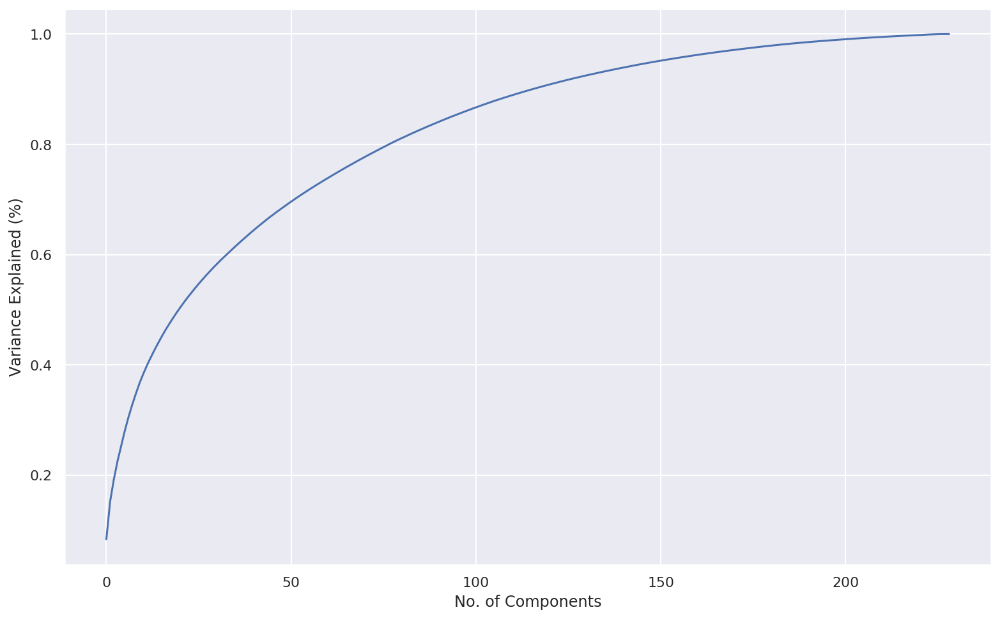

In [0]:
pca = PCA().fit(azdias)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('No. of Components')
plt.ylabel('Variance Explained (%)')
plt.show()

In [0]:
def pca_transform(df,n):
    global pca
    pca = PCA(n_components=n)
    transformed_data = pd.DataFrame(pca.fit_transform(df))
    print(pca.explained_variance_ratio_.sum())
    return transformed_data

In [0]:
# selecting 120 n-components based on above chart as it retains more than 90% variance.
%%time
azdias_pca = pca_transform(azdias, n=120)
customers_pca = pca_transform(customers, n=120)

0.9060771214882293
0.9042891190068887
CPU times: user 2min 1s, sys: 26.7 s, total: 2min 28s
Wall time: 47.3 s


In [0]:
def elbow_plot(data, start_K, end_K, step):
    '''
    Generates an elbow plot to find optimal number of clusters
    graphing K values from start_K to end_K every step value
    
    INPUT: 
        data: Demographics DataFrame
        start_K: Inclusive starting value for cluster number
        end_K: Exclusive stopping value for cluster number
        step: Step value between start_K and end_K
    OUTPUT: Trimmed and cleaned demographics DataFrame
    '''
    score_list = []

    for i in range(start_K, end_K, step):
        print(i)
        start = time.time()
        kmeans = KMeans(i)
        model = kmeans.fit(data)
        score = model.score(data)
        score_list.append(abs(score))
        end = time.time()
        elapsed_time = end - start
        print(elapsed_time)

    plt.plot(range(start_K, end_K, step), 
    score_list, linestyle='--', marker='o', color='b');
    plt.xlabel('# of clusters K');
    plt.ylabel('Sum of squared errors');
    plt.title('SSE vs. K');

1
16.719720125198364
3
113.28463459014893
5
187.56377291679382
7
443.5559284687042
9
435.1332473754883
11
514.429468870163
13
644.1196641921997
15
668.5473103523254
17
761.4800519943237
19
844.9050009250641
CPU times: user 1h 24min 8s, sys: 5min 24s, total: 1h 29min 32s
Wall time: 1h 17min 9s


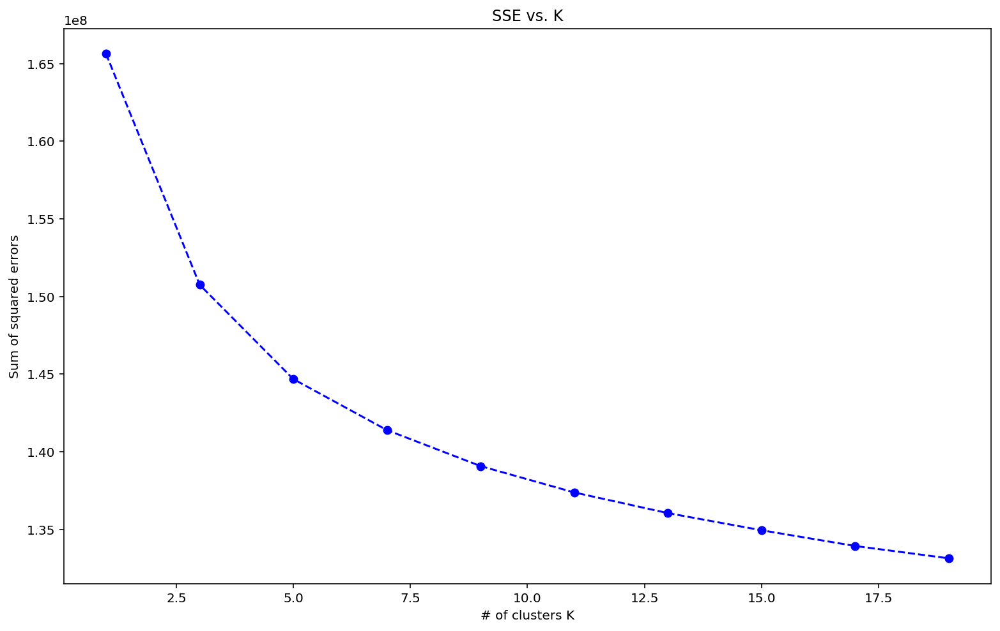

In [0]:
%%time
elbow_plot(azdias, 1, 20, 2)


In [0]:
#k=7 is taken as the curve starts to flatten after that 
%%time
k_m = KMeans(7)
k_model = k_m.fit(azdias_pca)
k_pred = k_model.predict(azdias_pca)

CPU times: user 3min 35s, sys: 17 s, total: 3min 52s
Wall time: 3min 20s


In [0]:
k_pred[:15]

array([2, 1, 3, 1, 2, 2, 2, 1, 1, 6, 2, 2, 1, 6, 2], dtype=int32)

In [0]:
azdias_clustered = pd.DataFrame(k_model.predict(azdias_pca),columns=['Cluster'])
customers_clustered = pd.DataFrame(k_model.predict(customers_pca),columns=['Cluster'])


In [0]:
azdias_clustered.head()

,Cluster
0,2
1,1
2,3
3,1
4,2


In [0]:
# Finding difference in proportions of customer ratio to population ratio for each cluster.
customer_clusters = customers_clustered['Cluster'].value_counts().sort_index()
population_clusters = azdias_clustered["Cluster"].value_counts().sort_index()
df_stacked = pd.concat([customer_clusters,population_clusters],axis=1).reset_index()
df_stacked.columns = ['Cluster','Customer','Population']
df_stacked['Difference'] = (df_stacked['Customer']/df_stacked['Customer'].sum()*100) - (df_stacked['Population']/df_stacked['Population'].sum()*100)
df_stacked

,Cluster,Customer,Population,Difference
0,0,11007,57698,0.575814
1,1,17691,109405,-1.369292
2,2,19172,125248,-2.404062
3,3,28823,163161,-0.154085
4,4,15731,88825,-0.053135
5,5,7389,57006,-2.128953
6,6,29400,125087,5.533713


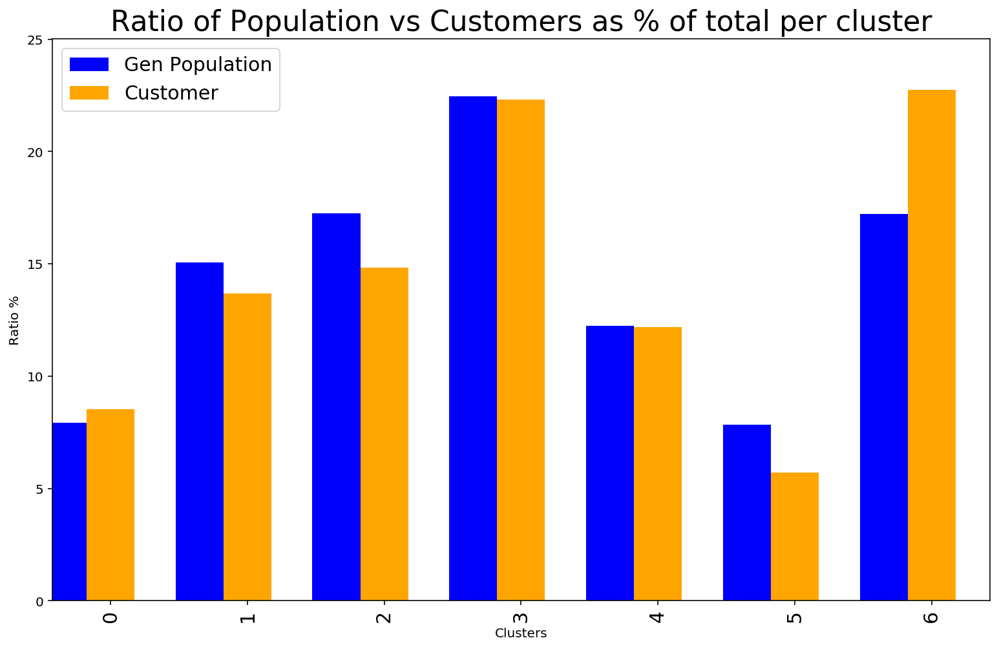

In [0]:
# plotting the ratio values of population and customers per cluster side by side. 
df_stacked['Population_Percent'] = (df_stacked['Population']/df_stacked['Population'].sum()*100).round(2)
df_stacked['Customer_Percent'] = (df_stacked['Customer']/df_stacked['Customer'].sum()*100).round(2)


fig = plt.figure()

ax = fig.add_subplot(111)
ax = df_stacked['Population_Percent'].plot(x=df_stacked['Cluster'],width=-0.35,align='edge',color='blue',kind='bar',position=0)
ax = df_stacked['Customer_Percent'].plot(width = 0.35, align='edge',color='orange', kind='bar',position=1)
ax.set_xlabel('Clusters') 
ax.set_ylabel('Ratio %')
ax.xaxis.set(ticklabels=range(20))
ax.tick_params(axis = 'x', which = 'major', labelsize = 15)
ax.margins(x=0.5,y=0.1)
plt.legend(('Gen Population', 'Customer'),fontsize=15)
plt.title('Ratio of Population vs Customers as % of total per cluster', fontdict={'fontsize': 22})
plt.show()

[Text(0, 0.5, 'Proportion'),
 Text(0.5, 0, 'Clusters'),
 Text(0.5, 1.0, 'Difference in proportion between populations')]

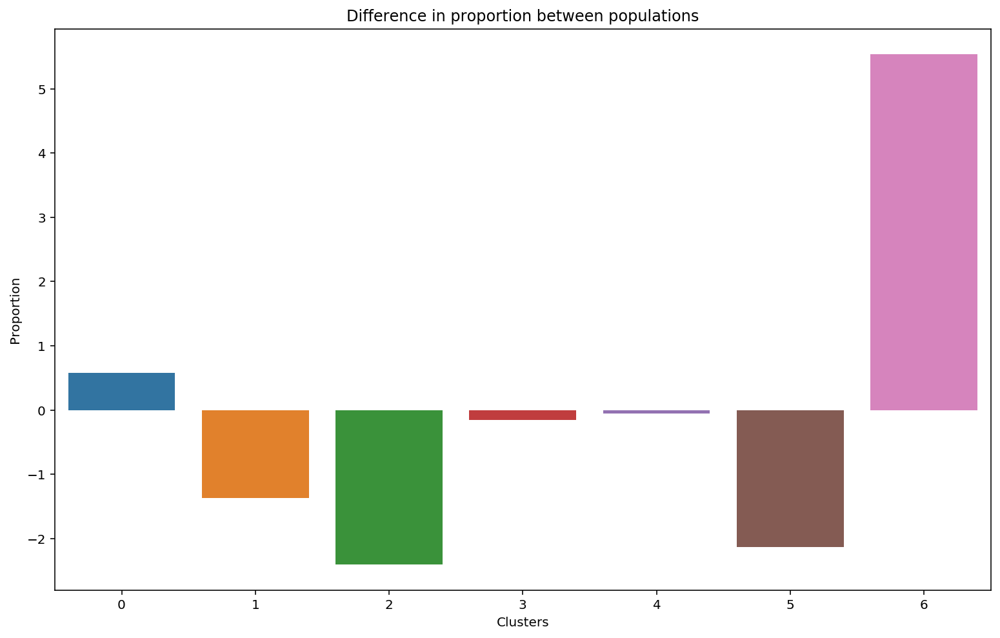

In [0]:
# plotting the proportion difference calculated above.
fig = plt.figure()
ax = sns.barplot(x = df_stacked['Cluster'], y = df_stacked['Difference'])
ax.set(title='Difference in proportion between populations',ylabel='Proportion', xlabel='Clusters')

In [0]:
target = customers_clustered[customers_clustered['Cluster'] == 6].index
general = azdias_clustered[azdias_clustered['Cluster'] == 2].index

df_target = customers.iloc[target]
df_general = azdias.iloc[general]

df_target_inv = pd.DataFrame(scaler.inverse_transform(df_target),columns=df_target.columns)
df_general_inv = pd.DataFrame(scaler.inverse_transform(df_general),columns=df_general.columns) 

In [0]:
df_target_inv.shape

(29400, 229)

In [0]:
# plotting graph for comparison of each feature on over-represented vs under-represented cluster.
def plot_comparison(column, customer, general, clusters=[6,2]):
    '''
    Plots the distribution for a feature.
    
    Args:
        column (string) - feature to plot.
        customer (dataframe) - customer population cluster.
        general (dataframe) - general population cluster.
        clusters (list) - ints to use when pritting out title.
    '''   
    sns.set(style="darkgrid")
    fig, (ax1, ax2) = plt.subplots(figsize=(20,4), ncols=2)
    sns.countplot(x=column, data=df_target_inv, ax=ax1, palette="Set2")
    ax1.set_xlabel('Value')
    ax1.set_title(f'Distribution Customer population (cluster: {clusters[0]})')
    sns.countplot(x=column, data=df_general_inv, ax=ax2, palette="Set2")
    ax2.set_xlabel('Value')
    ax2.set_title(f'Distribution General population (cluster: {clusters[1]})')
    fig.suptitle(f'Feature: {column}')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


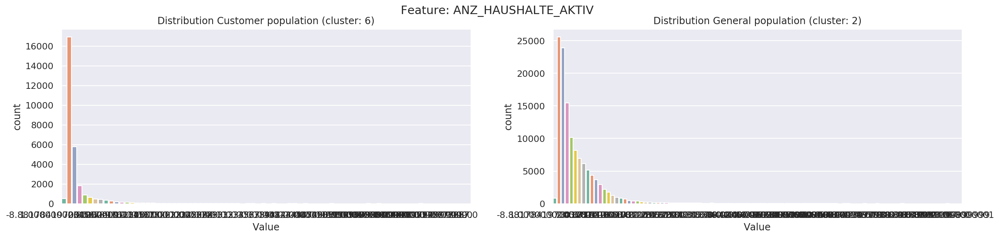

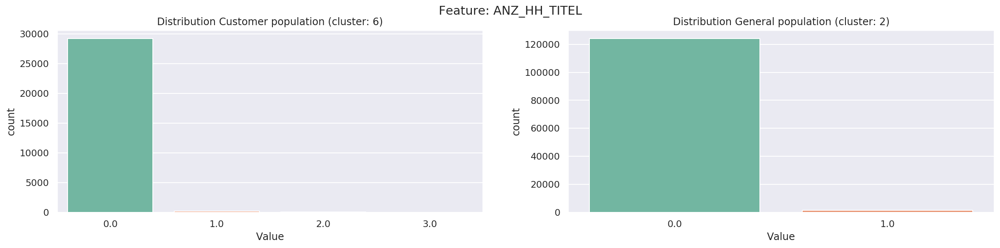

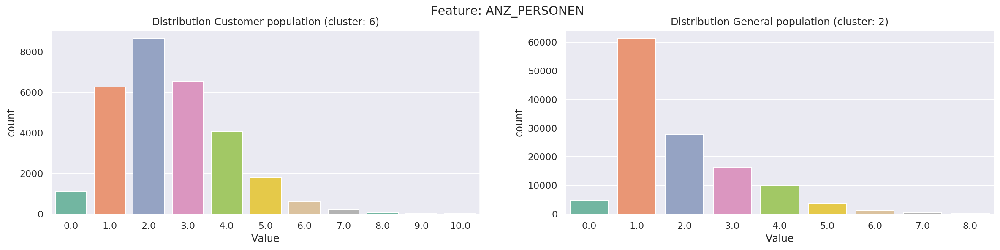

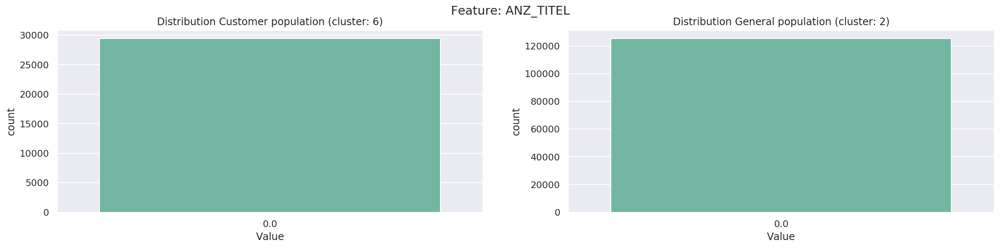

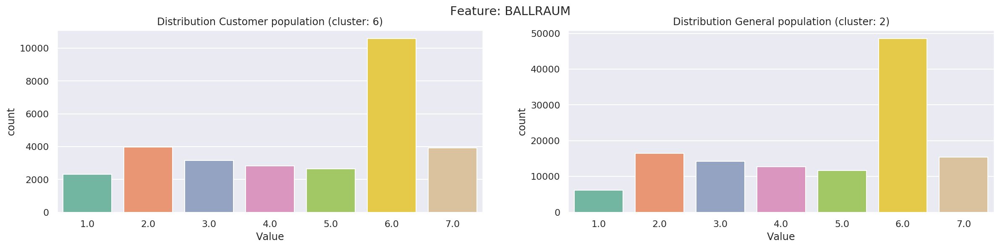

...

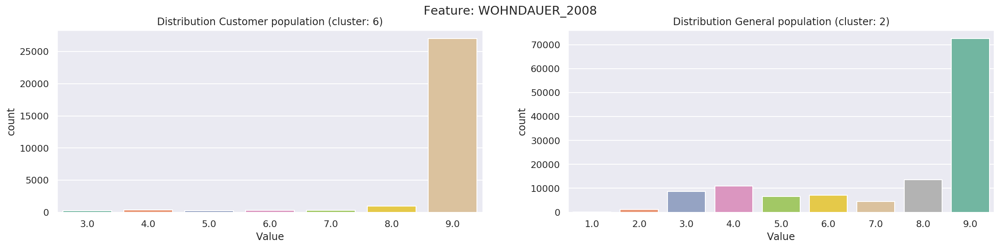

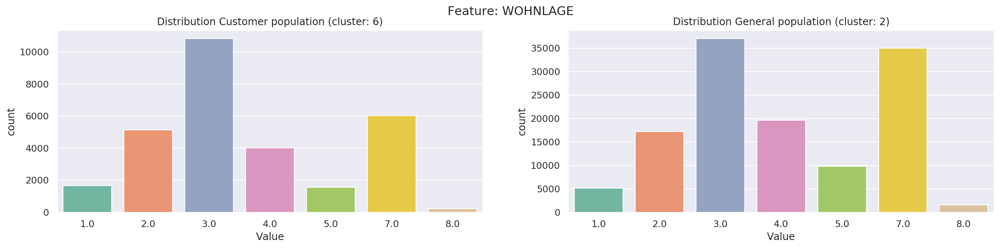

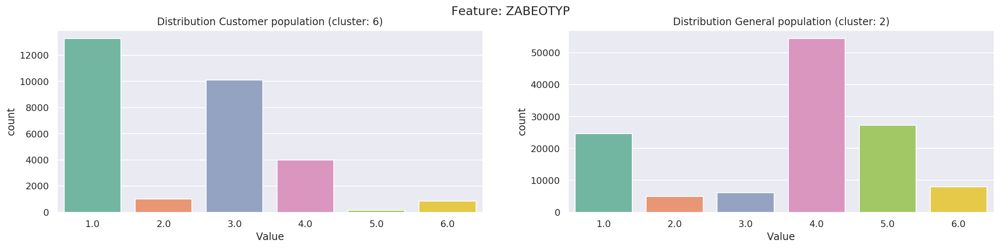

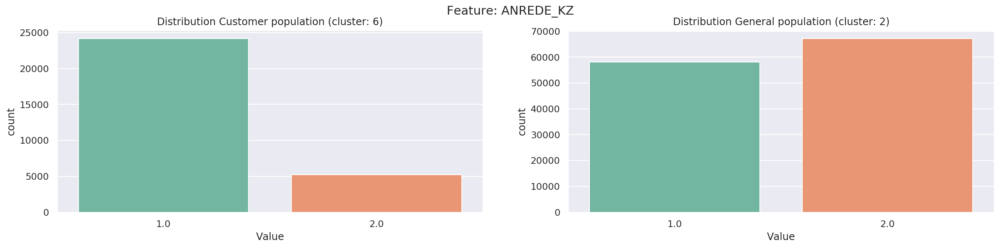

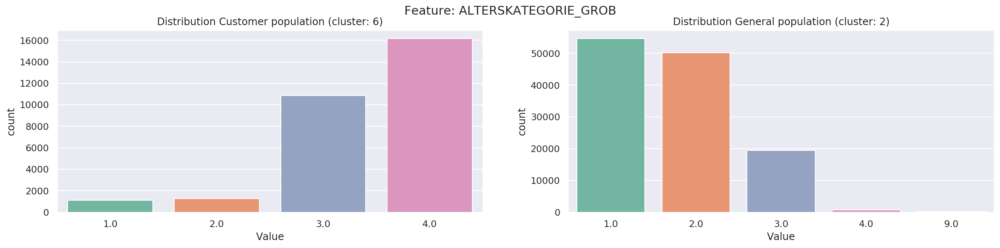

In [0]:
for values in df_target_inv.columns:
  plot_comparison(column=values, customer=df_target_inv, general=df_general_inv)

The following conclusion can me made from the graphs above:

# Part 2 Supervised Learning Model

In [0]:
azdias = pd.read_csv('/content/gdrive/My Drive/Bertelsmann Data Science Project/azdias_with_missing_values.csv')
nans = pd.read_csv('/content/gdrive/My Drive/Bertelsmann Data Science Project/nans.csv')
del nans['Unnamed: 0']


/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [0]:
mailout_train = pd.read_csv('/content/gdrive/My Drive/Bertelsmann Data Science Project/Train.csv',dtype={18:'str',19:'str'})
mailout_test = pd.read_csv('/content/gdrive/My Drive/Bertelsmann Data Science Project/Test.csv',dtype={18:'str',19:'str'})

In [0]:
mailout_train = mailout_train.set_index('LNR')
mailout_test = mailout_test.set_index('LNR')

In [0]:
y = mailout_train['RESPONSE']
del mailout_train['RESPONSE']
X = mailout_train

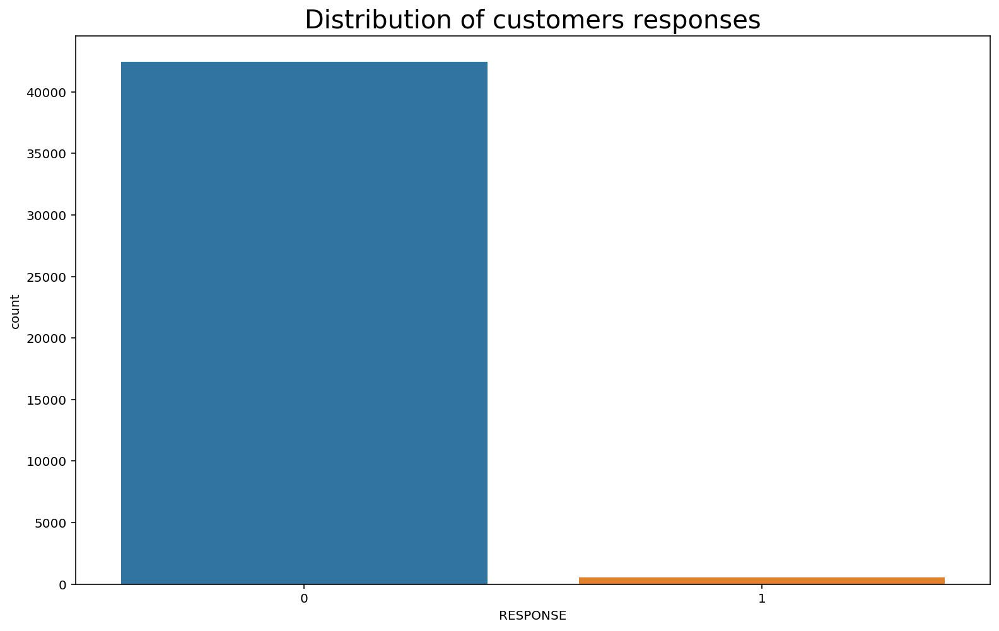

In [0]:
plt.title('Distribution of customers responses',fontdict = {'fontsize' : 20})
sns.countplot(y);

## Benchmark Model

In [0]:
cols_to_drop = ['CAMEO_DEU_2015', 'CAMEO_DEUG_2015', 'CAMEO_INTL_2015', 'D19_LETZTER_KAUF_BRANCHE','EINGEFUEGT_AM', 'OST_WEST_KZ']
X.drop(columns=cols_to_drop,inplace=True)

In [0]:
# run simple xgb model with default settings as benchmark
model = xgb.XGBClassifier()
model.fit(X,y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [0]:
test_pred = model.predict_proba(mailout_test)

In [0]:
submission = pd.DataFrame({'LNR':mailout_test.index, 'RESPONSE':test_pred[:, 1]})

In [0]:
# Submitting to kaggle competitions page gave a score of 0.79772
%cd /content/gdrive/My Drive/Bertelsmann Data Science Project
submission.to_csv('submission_benchmark.csv', index=False)

/content/gdrive/My Drive/Bertelsmann Data Science Project


## Data Cleaning

In [0]:
# Making cleaning function for new data sets based on pre-processing done before.
def cleaning_func(df):
  for row in nans['Attributes']:
    if row in df.columns:
        _m = nans.loc[nans['Attributes'] == row, 'missing_or_unknown'].iloc[0]
        _i = df.loc[:, row].isin(_m)
        df.loc[_i, row] = np.NaN
    else:
        continue

  for col in df.columns:
      if df[col].dtype == np.int64:
          df[col] = df[col].astype(np.float64)
  cols_to_drop = ['CAMEO_DEU_2015', 'CAMEO_DEUG_2015', 'CAMEO_INTL_2015', 'D19_LETZTER_KAUF_BRANCHE','EINGEFUEGT_AM']

  df.drop(columns=cols_to_drop,inplace=True)

  df['OST_WEST_KZ'].replace(['W', 'O'], [1, 0], inplace=True)

  dummy_cols = ['CJT_GESAMTTYP', 'FINANZTYP', 'GEBAEUDETYP', 'GEBAEUDETYP_RASTER', 'HEALTH_TYP', 
                    'KBA05_HERSTTEMP', 'KBA05_MAXHERST', 'KBA05_MODTEMP', 'LP_FAMILIE_GROB', 'LP_STATUS_GROB',
                    'NATIONALITAET_KZ', 'SHOPPER_TYP', 'VERS_TYP']
  for col in dummy_cols:
    dummy = pd.get_dummies(df[col], prefix = col)
    df = pd.concat([df, dummy], axis = 1)
  print(df.shape)
  df.drop(dummy_cols, axis=1, inplace = True)
  print(df.shape)

  imputer = SimpleImputer(missing_values=np.nan,strategy='mean')
  df = pd.DataFrame(imputer.fit_transform(df), columns = df.columns,index = df.index)
  print(df.head())
# not scaling values for xgboost as it results in better score without it.
#  scaler = StandardScaler()
#  df = pd.DataFrame(scaler.fit_transform(df), columns = df.columns,index = df.index)

  return df



In [0]:
X_cleaned = cleaning_func(X)

(42962, 422)
(42962, 409)
      AGER_TYP  AKT_DAT_KL  ...  VERS_TYP_1.0  VERS_TYP_2.0
LNR                         ...                            
1763       2.0         1.0  ...           0.0           1.0
1771       1.0         4.0  ...           1.0           0.0
1776       1.0         1.0  ...           1.0           0.0
1460       2.0         1.0  ...           0.0           1.0
1783       2.0         1.0  ...           1.0           0.0

[5 rows x 409 columns]


In [0]:
mailout_test_cleaned = cleaning_func(mailout_test)

(42833, 422)
(42833, 409)
      AGER_TYP  AKT_DAT_KL  ...  VERS_TYP_1.0  VERS_TYP_2.0
LNR                         ...                            
1754  2.000000         1.0  ...           1.0           0.0
1770  1.715618         1.0  ...           1.0           0.0
1465  2.000000         9.0  ...           1.0           0.0
1470  1.715618         7.0  ...           0.0           1.0
1478  1.000000         1.0  ...           1.0           0.0

[5 rows x 409 columns]


## Model Selection

In [0]:
# Choosing the algorithm with best base performance.
def fit_classifier(model, params, X=X_cleaned, y=y):
    """
    Fits a classifier to its training data using GridSearchCV and calculates ROC AUC score
    
    INPUT:
    - clf (classifier): classifier to fit
    - params (dict): classifier parameters used with GridSearchCV
    - X_train (DataFrame): training input
    - y_train (DataFrame): training output
            
    OUTPUT:
    - classifier: input classifier fitted to the training data
    """
    
    # cv uses StratifiedKFold
    start = time.time()
    grid = GridSearchCV(estimator=model, param_grid=params, scoring='roc_auc', cv=5, verbose=0)
    print("Training {} :".format(model.__class__.__name__))
    grid.fit(X, y)
    end = time.time()
    time_taken = round(end-start,2)

    print(model.__class__.__name__)
    print("Time taken : {} secs".format(time_taken))
    print("Best score : {}".format(round(grid.best_score_,4)))
    print("*"*40)
    
    return grid.best_score_, grid.best_estimator_, time_taken

In [0]:
abc = AdaBoostClassifier(random_state=42) # AdaBoostClassifier
gbc = GradientBoostingClassifier(random_state=42) # GradientBoostingClassifier
xgbc = xgb.XGBClassifier(random_state=42) # XGBoost Classifier
cbc = CatBoostClassifier(random_state=42) # CatBoost Classifier
lgbm = lgb.LGBMClassifier(random_state=42) # Light GMB


In [0]:
model_names = []
model_scores = []
model_best_ests = []
model_time_taken = []
model_dict = {}

for model in [abc, gbc,xgbc,cbc,lgbm]:
    best_score, best_est, time_taken = fit_classifier(model, {})
    model_names.append(model.__class__.__name__)
    model_scores.append(best_score)
    model_best_ests.append(best_est)
    model_time_taken.append(time_taken)

Training AdaBoostClassifier :
AdaBoostClassifier
Time taken : 94.31 secs
Best score : 0.7259
****************************************
Training GradientBoostingClassifier :
GradientBoostingClassifier
Time taken : 405.97 secs
Best score : 0.7531
****************************************
Training XGBClassifier :
XGBClassifier
Time taken : 186.93 secs
Best score : 0.7574
****************************************
Training CatBoostClassifier :
Learning rate set to 0.046653
0:	learn: 0.5984964	total: 118ms	remaining: 1m 57s
1:	learn: 0.5174848	total: 192ms	remaining: 1m 35s
2:	learn: 0.4491613	total: 255ms	remaining: 1m 24s
3:	learn: 0.3909536	total: 327ms	remaining: 1m 21s
4:	learn: 0.3425278	total: 384ms	remaining: 1m 16s
5:	learn: 0.3016333	total: 461ms	remaining: 1m 16s
6:	learn: 0.2667780	total: 539ms	remaining: 1m 16s
7:	learn: 0.2371073	total: 610ms	remaining: 1m 15s
8:	learn: 0.2127636	total: 674ms	remaining: 1m 14s
9:	learn: 0.1918296	total: 747ms	remaining: 1m 13s
10:	learn: 0.1736684

## Hyperparameter Optimzation

In [0]:
# intermediate model
# The XGBoost model gave the best base score therefore it was tuned to beat the benchmark score.
# submitting model to kaggle. Multiple parameters were trained using some help from the following links.
# https://towardsdatascience.com/fine-tuning-xgboost-in-python-like-a-boss-b4543ed8b1e

%%time
# Due to technical limitations, I ultimately ended up using randomizedsearch instead of gridsearch here. 
model = xgb.XGBClassifier(objective= 'binary:logistic')

param_grid = {'subsample' : [0.8,1],
          'n_estimators' : [100, 1000], 
          'learning_rate' : [0.01,0.001],   
          'max_depth': [4,5,6,7],
          'scale_pos_weight': [10,25],
          'gamma': [1,5,10],
          'colsample_bytree' : [0.3,0.5,0.8]
              }


kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
random_search = RandomizedSearchCV(model,param_distributions=param_grid,n_iter=50,scoring='roc_auc',n_jobs=-1,cv=kfold,verbose=1)
#grid_search = GridSearchCV(model, param_grid = param_grid, scoring="roc_auc", n_jobs=-1, cv=kfold, verbose=1)
grid_result = random_search.fit(X_cleaned, y)

print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_)) 

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 46.6min
/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 175.5min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed: 242.1min finished


Best: 0.766841 using {'subsample': 0.8, 'scale_pos_weight': 10, 'n_estimators': 100, 'max_depth': 7, 'learning_rate': 0.01, 'gamma': 5, 'colsample_bytree': 0.8}
CPU times: user 1min 13s, sys: 710 ms, total: 1min 14s
Wall time: 4h 3min 14s


In [0]:
# final model
# The XGBoost model gave the best base score therefore it was tuned to beat the benchmark score.
# submitting model to kaggle. Multiple parameters were trained using some help from the following links.
# https://towardsdatascience.com/fine-tuning-xgboost-in-python-like-a-boss-b4543ed8b1e

%%time

model = xgb.XGBClassifier(objective= 'binary:logistic')

param_grid = {'n_estimators' : [20, 50, 100], 
          'learning_rate' : [0.01,0.001],   
          'max_depth': [4,5,6,7],
          'scale_pos_weight': [1,10],
          'colsample_bytree' : [0.5,0.8]
              }


kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(model, param_grid = param_grid, scoring="roc_auc", n_jobs=-1, cv=kfold, verbose=1)
grid_result = grid_search.fit(X_cleaned, y)

print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_)) 

Fitting 5 folds for each of 96 candidates, totalling 480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed: 45.0min
[Parallel(n_jobs=-1)]: Done 480 out of 480 | elapsed: 51.1min finished


Best: 0.766173 using {'colsample_bytree': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'scale_pos_weight': 10}
CPU times: user 31.5 s, sys: 705 ms, total: 32.2 s
Wall time: 51min 33s


In [0]:
# submitted after the model above but gave worse score.
# The XGBoost model gave the best base score therefore it was tuned to beat the benchmark score.
# submitting model to kaggle. Multiple parameters were trained using some help from the following links.
# https://towardsdatascience.com/fine-tuning-xgboost-in-python-like-a-boss-b4543ed8b1e
# this time with 10 splits.
%%time

model = xgb.XGBClassifier(objective= 'binary:logistic')

param_grid = {'n_estimators' : [20, 50, 100], 
          'learning_rate' : [0.01,0.001],   
          'max_depth': [4,5,6,7],
          'scale_pos_weight': [1,10],
          'colsample_bytree' : [0.5,0.8]
              }


kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
grid_search = GridSearchCV(model, param_grid = param_grid, scoring="roc_auc", n_jobs=-1, cv=kfold, verbose=1)
grid_result = grid_search.fit(X_cleaned, y)

print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_)) 

Fitting 10 folds for each of 96 candidates, totalling 960 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed: 40.1min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed: 89.0min
[Parallel(n_jobs=-1)]: Done 960 out of 960 | elapsed: 115.1min finished


Best: 0.770858 using {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'scale_pos_weight': 10}
CPU times: user 47.6 s, sys: 2.03 s, total: 49.7 s
Wall time: 1h 55min 46s


# Part 3: Kaggle Competition


In [0]:
## best params
opt_params = {'colsample_bytree': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'scale_pos_weight': 10}
model = xgb.XGBClassifier(**opt_params)
model.fit(X_cleaned,y)



XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.5, gamma=0,
              learning_rate=0.01, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=10, seed=None,
              silent=None, subsample=1, verbosity=1)

In [0]:
test_pred = model.predict_proba(mailout_test_cleaned)

In [0]:
submission = pd.DataFrame({'LNR':mailout_test_cleaned.index, 'RESPONSE':test_pred[:, 1]})

In [0]:
%cd /content/gdrive/My Drive/Bertelsmann Data Science Project
submission.to_csv('submission_again.csv', index=False)

/content/gdrive/My Drive/Bertelsmann Data Science Project


#### The best score I got on leaderboard from training different models is 0.80453 which beats the benchmark score of 0.79772 and puts me in 22th position in the competition's public leaderboard at the time of writing.